In [1]:
import sys

import pathlib
import asdf
import astropy.units as u
import astropy.table
import sunpy.map

import eispac
import eispac.data
import eispac.core

sys.path.append('../scripts')
from correct_eis_pointing import fix_eis_pointing

# Fit EIS Lines

In [2]:
selected_lines = astropy.table.Table.read('../data/tables/selected_eis_lines.asdf')

In [3]:
selected_lines

Element,Z,Ion,Name,Wavelength,Number Gaussians,Included lines,Template filename
,,,,Angstrom,,,
str2,int64,int64,str15,float64,int64,str89,str28
Si,14,7,Si VII 275.368,275.368,3,"Si VII 275.368, unknown I 275.553, Si VII 275.665",si_07_275_368.3c.template.h5
Si,14,10,Si X 258.375,258.375,1,Si X 258.375,si_10_258_375.1c.template.h5
S,16,10,S X 264.233,264.233,1,S X 264.233,s__10_264_233.1c.template.h5
S,16,13,S XIII 256.686,256.686,1,S XIII 256.686,s__13_256_686.1c.template.h5
Ar,18,14,Ar XIV 194.396,194.396,6,"Fe X 193.715, Ca XIV 193.874, Ni XVI 194.046, Ar XI 194.104, Mn X 194.327, Ar XIV 194.396",ar_14_194_396.6c.template.h5
Ca,20,14,Ca XIV 193.874,193.874,6,"Fe X 193.715, Ca XIV 193.874, Ni XVI 194.046, Ar XI 194.104, Mn X 194.327, Ar XIV 194.396",ca_14_193_874.6c.template.h5
Ca,20,15,Ca XV 200.972,200.972,2,"Ca XV 200.972, Fe XIII 201.121",ca_15_200_972.2c.template.h5
Ca,20,16,Ca XVI 208.604,208.604,2,"Ca XVI 208.604, Fe XIII 208.679",ca_16_208_604.2c.template.h5


In [4]:
observation_table = astropy.table.Table.read('../data/tables/mason_ars_region_1.asdf')

In [5]:
root_dir = pathlib.Path('../data')

In [6]:
observation_table

NOAA AR,Comment,Date start,Date end,Date mid,bottom left,top right,EIS file,XRT file
,,,,,arcsec,arcsec,,
int64,str80,Time,Time,Time,float64[2],float64[2],str19,str28
11944,Adjusted start time to avoid flare on 2014-01-07 18:00:00,2014-01-08T06:00:00.000,2014-01-08T18:00:00.000,2014-01-08T12:00:00.000,-200.0 .. -330.0,330.0 .. 100.0,eis_20140108_095727,
11967,Adjusted start time to center interval on EIS raster scan,2014-02-03T05:00:00.000,2014-02-03T17:00:00.000,2014-02-03T11:00:00.000,-278.0 .. -400.0,260.0 .. 0.0,eis_20140203_093134,L1_XRT20140203_110221.2.fits
11990,Adjusted start time to avoid eclipse on 2014-03-02 06:00:00,2014-03-01T18:00:00.000,2014-03-02T06:00:00.000,2014-03-02T00:00:00.000,-350.0 .. -400.0,150.0 .. 0.0,eis_20140302_000659,L1_XRT20140302_000009.0.fits


This step is needed because there are some templates which fit the exact same lines, but have different names. In order to avoid multiple costly fits, we fine only those templates which have a unique set of lines in them.

In [7]:
unique_templates = []
for g in selected_lines.group_by('Included lines').groups:
    unique_templates.append(str(g[['Template filename']][0][0]))

In [8]:
for template_name in unique_templates:
    template = eispac.read_template(eispac.data.get_fit_template_filepath(template_name))
    print(template)
    for row in observation_table:
        print(row['NOAA AR'])
        eis_dir = root_dir / f'noaa_{row["NOAA AR"]}' / 'EIS'
        cube = eispac.read_cube(eis_dir / 'level_1' / f'{row["EIS file"]}.data.h5',
                                window=template.central_wave)
        fit_res = eispac.fit_spectra(cube, template, ncpu='max')
        _ = eispac.export_fits(fit_res, save_dir=eis_dir / 'level_2')

--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_15_284_160.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Al IX 284.015' 'Fe XV 284.160']
wmin, wmax: 283.82000732421875, 284.3600158691406

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]       106.0826       0     1     0       0.0000       0.0000                   
  p[1]       284.0320       0     1     1     283.9919     284.0721                   
  p[2]         0.0380       0     1     1       0.0191       0.0510                   
  p[3]       244.5079       0     1     0       0.0000       0.0000                   
  p[4]       284.1622       0     1     1     284.1220     284.2023                   
  p[5]         0.0347       0     1     1       0.0191       0.0510                   
  p[6]         4.7714       0     0     0       0.0000       0.0000                   
11944
Data file,
   /Users/

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof


 + working on exposure 105

Finished computing fits!
   runtime : 0:00:30.409894
   45051 spectra fit without issues
   16389 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.al_09_284_015.2c-0.int.fits
              eis_20140203_093134.al_09_284_015.2c-0.vel.fits
              eis_20140203_093134.al_09_284_015.2c-0.wid.fits
              eis_20140203_093134.fe_15_284_160.2c-1.int.fits
              eis_20140203_093134.fe_15_284_160.2c-1.vel.fits
              eis_20140203_093134.fe_15_284_160.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 28

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:09.373843
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.al_09_284_015.2c-0.int.fits
              eis_20140302_000659.al_09_284_015.2c-0.vel.fits
              eis_20140302_000659.al_09_284_015.2c-0.wid.fits
              eis_20140302_000659.fe_15_284_160.2c-1.int.fits
              eis_20140302_000659.fe_15_284_160.2c-1.vel.fits
              eis_20140302_000659.fe_15_284_160.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/ca_15_200_972.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Ca XV 200.972' 'Fe XIII 201.121']
wmin, wmax: 200.80999755859375, 201.27999877929688

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed 

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:23.400300
   46077 spectra fit without issues
   15363 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.ca_15_200_972.2c-0.int.fits
              eis_20140203_093134.ca_15_200_972.2c-0.vel.fits
              eis_20140203_093134.ca_15_200_972.2c-0.wid.fits
              eis_20140203_093134.fe_13_201_121.2c-1.int.fits
              eis_20140203_093134.fe_13_201_121.2c-1.vel.fits
              eis_20140203_093134.fe_13_201_121.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SU

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 201.0449981689453 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:54.854266
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.ca_16_208_604.2c-0.int.fits
              eis_20140108_095727.ca_16_208_604.2c-0.vel.fits
              eis_20140108_095727.ca_16_208_604.2c-0.wid.fits
              eis_20140108_095727.fe_13_208_679.2c-1.int.fits
              eis_20140108_095727.fe_13_208_679.2c-1.vel.fits
              eis_20140108_095727.fe_13_208_679.2c-1.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 208.67

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 208.67200469970703 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 120

Finished computing fits!
   runtime : 0:00:23.058858
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.ca_17_192_858.1c-0.int.fits
              eis_20140108_095727.ca_17_192_858.1c-0.vel.fits
              eis_20140108_095727.ca_17_192_858.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 192.95 [Angstr

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:07.041595
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.ca_17_192_858.1c-0.int.fits
              eis_20140302_000659.ca_17_192_858.1c-0.vel.fits
              eis_20140302_000659.ca_17_192_858.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_09_188_497.3c.template.h5
n_gauss: 3
n_poly: 1
line_ids: ['Fe IX 188.497' 'S XI 188.675' 'Ar XI 188.806']
wmin, wmax: 188.39999389648438, 188.9499969482422

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]       202.6891       0     1     0       0.0000       0.0000                   
  p[1]       188.4919       0     1

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered i

 + working on exposure 120

Finished computing fits!
   runtime : 0:01:14.509277
   59829 spectra fit without issues
   1611 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_09_188_497.3c-0.int.fits
              eis_20140108_095727.fe_09_188_497.3c-0.vel.fits
              eis_20140108_095727.fe_09_188_497.3c-0.wid.fits
              eis_20140108_095727.s__11_188_675.3c-1.int.fits
              eis_20140108_095727.s__11_188_675.3c-1.vel.fits
              eis_20140108_095727.s__11_188_675.3c-1.wid.fits
              eis_20140108_095727.ar_11_188_806.3c-2.int.fits
              eis_20140108_095727.ar_11_188_806.3c-2.vel.fits
              eis_20140108_095727.ar_11_188_806.3c-2.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)


/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: invalid value encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in

 + working on exposure 105

Finished computing fits!
   runtime : 0:00:58.028441
   45273 spectra fit without issues
   16167 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_09_188_497.3c-0.int.fits
              eis_20140203_093134.fe_09_188_497.3c-0.vel.fits
              eis_20140203_093134.fe_09_188_497.3c-0.wid.fits
              eis_20140203_093134.s__11_188_675.3c-1.int.fits
              eis_20140203_093134.s__11_188_675.3c-1.vel.fits
              eis_20140203_093134.s__11_188_675.3c-1.wid.fits
              eis_20140203_093134.ar_11_188_806.3c-2.int.fits
              eis_20140203_093134.ar_11_188_806.3c-2.vel.fits
              eis_20140203_093134.ar_11_188_806.3c-2.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_2

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 048

Finished computing fits!
   runtime : 0:00:18.487087
   12000 spectra fit without issues
   0 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_09_188_497.3c-0.int.fits
              eis_20140302_000659.fe_09_188_497.3c-0.vel.fits
              eis_20140302_000659.fe_09_188_497.3c-0.wid.fits
              eis_20140302_000659.s__11_188_675.3c-1.int.fits
              eis_20140302_000659.s__11_188_675.3c-1.vel.fits
              eis_20140302_000659.s__11_188_675.3c-1.wid.fits
              eis_20140302_000659.ar_11_188_806.3c-2.int.fits
              eis_20140302_000659.ar_11_188_806.3c-2.vel.fits
              eis_20140302_000659.ar_11_188_806.3c-2.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_09_197_862.1c.temp

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 102

Finished computing fits!
   runtime : 0:00:13.085899
   45136 spectra fit without issues
   16304 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_09_197_862.1c-0.int.fits
              eis_20140203_093134.fe_09_197_862.1c-0.vel.fits
              eis_20140203_093134.fe_09_197_862.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_10_184_536.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe X 184.536']
wmin, wmax: 184.4900054

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 197.81499481201172 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 111

Finished computing fits!
   runtime : 0:00:13.981005
   61243 spectra fit without issues
   197 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_10_184_536.1c-0.int.fits
              eis_20140108_095727.fe_10_184_536.1c-0.vel.fits
              eis_20140108_095727.fe_10_184_536.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 184.60 [Angstroms] in window 2
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit o

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:10.935964
   45407 spectra fit without issues
   16033 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_10_184_536.1c-0.int.fits
              eis_20140203_093134.fe_10_184_536.1c-0.vel.fits
              eis_20140203_093134.fe_10_184_536.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 184.60 [Angstroms] in window 0
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 50 exposures, each with 240 spectra
 + running mpfit 

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 048

Finished computing fits!
   runtime : 0:00:04.747750
   11950 spectra fit without issues
   50 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_10_184_536.1c-0.int.fits
              eis_20140302_000659.fe_10_184_536.1c-0.vel.fits
              eis_20140302_000659.fe_10_184_536.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/ar_14_194_396.6c.template.h5
n_gauss: 6
n_poly: 1
line_ids: ['Fe X 193.715' 'Ca XIV 193.874' 'Ni XVI 194.046' 'Ar XI 194.104'
 'Mn X 194.327' 'Ar XIV 194.396']
wmin, wmax: 193.60000610351562, 194.60000610351562

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]      3058.9379       0     1     0       0.0000       0.0000  

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 114

Finished computing fits!
   runtime : 0:03:23.440597
   61440 spectra fit without issues
   0 spectra have < 19 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_10_193_715.6c-0.int.fits
              eis_20140108_095727.fe_10_193_715.6c-0.vel.fits
              eis_20140108_095727.fe_10_193_715.6c-0.wid.fits
              eis_20140108_095727.ca_14_193_874.6c-1.int.fits
              eis_20140108_095727.ca_14_193_874.6c-1.vel.fits
              eis_20140108_095727.ca_14_193_874.6c-1.wid.fits
              eis_20140108_095727.ni_16_194_046.6c-2.int.fits
              eis_20140108_095727.ni_16_194_046.6c-2.vel.fits
              eis_20140108_095727.ni_16_194_046.6c-2.wid.fits
              eis_20140108_095727.ar_11_194_104.6c-3.int.fits
              eis_20140108_095727.ar_11_194_104.6c-3.vel.fits
    

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 194.10000610351562 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_11_180_401.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XI 180.401']
wmin, wmax: 180.2010040283203, 180.5500030517578

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]     48352.2153       0     1     0       0.0000       0.0000                   
  p[1]       180.4042       0     1     1     180.3641     180.4444                   
  p[2]         0.0295       0     1     1       0.0191       0.0510                   
  p[3]       848.0303       0     0     0       0.0000       0.0000                   
11944
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11944/EIS/level_1/eis_20140108_095727.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11944/EIS/level_1/eis_20140108_095727.head.h5
Found a wavelen

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 180.37550354003906 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:17.946279
   59973 spectra fit without issues
   1467 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_11_188_216.2c-0.int.fits
              eis_20140108_095727.fe_11_188_216.2c-0.vel.fits
              eis_20140108_095727.fe_11_188_216.2c-0.wid.fits
              eis_20140108_095727.fe_11_188_299.2c-1.int.fits
              eis_20140108_095727.fe_11_188_299.2c-1.vel.fits
              eis_20140108_095727.fe_11_188_299.2c-1.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 188

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 108

Finished computing fits!
   runtime : 0:00:14.429922
   45468 spectra fit without issues
   15972 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_11_188_216.2c-0.int.fits
              eis_20140203_093134.fe_11_188_216.2c-0.vel.fits
              eis_20140203_093134.fe_11_188_216.2c-0.wid.fits
              eis_20140203_093134.fe_11_188_299.2c-1.int.fits
              eis_20140203_093134.fe_11_188_299.2c-1.vel.fits
              eis_20140203_093134.fe_11_188_299.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_0

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:05.916941
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_11_188_216.2c-0.int.fits
              eis_20140302_000659.fe_11_188_216.2c-0.vel.fits
              eis_20140302_000659.fe_11_188_216.2c-0.wid.fits
              eis_20140302_000659.fe_11_188_299.2c-1.int.fits
              eis_20140302_000659.fe_11_188_299.2c-1.vel.fits
              eis_20140302_000659.fe_11_188_299.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_12_192_394.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XII 192.394']
wmin, wmax: 192.24000549316406, 192.5800018310547

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited       

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:04.484762
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_12_192_394.1c-0.int.fits
              eis_20140302_000659.fe_12_192_394.1c-0.vel.fits
              eis_20140302_000659.fe_12_192_394.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_12_195_119.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Fe XII 195.119' 'Fe XII 195.179']
wmin, wmax: 194.9600067138672, 195.25

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]     57514.6647       0     1     0       0.0000       0.0000                   
  p[1]       195.1179       0     1     1     195.0778     1

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:14.532312
   45509 spectra fit without issues
   15931 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_12_195_119.2c-0.int.fits
              eis_20140203_093134.fe_12_195_119.2c-0.vel.fits
              eis_20140203_093134.fe_12_195_119.2c-0.wid.fits
              eis_20140203_093134.fe_12_195_179.2c-1.int.fits
              eis_20140203_093134.fe_12_195_179.2c-1.vel.fits
              eis_20140203_093134.fe_12_195_179.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 19

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:05.994158
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_12_195_119.2c-0.int.fits
              eis_20140302_000659.fe_12_195_119.2c-0.vel.fits
              eis_20140302_000659.fe_12_195_119.2c-0.wid.fits
              eis_20140302_000659.fe_12_195_179.2c-1.int.fits
              eis_20140302_000659.fe_12_195_179.2c-1.vel.fits
              eis_20140302_000659.fe_12_195_179.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_13_203_826.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Fe XII 203.720' 'Fe XIII 203.826']
wmin, wmax: 203.5399932861328, 204.02999877929688

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed 

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:06.256454
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_12_203_720.2c-0.int.fits
              eis_20140302_000659.fe_12_203_720.2c-0.vel.fits
              eis_20140302_000659.fe_12_203_720.2c-0.wid.fits
              eis_20140302_000659.fe_13_203_826.2c-1.int.fits
              eis_20140302_000659.fe_13_203_826.2c-1.vel.fits
              eis_20140302_000659.fe_13_203_826.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_13_202_044.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XIII 202.044']
wmin, wmax: 201.89999389648438, 202.24400329589844

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited     

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:08.711769
   46045 spectra fit without issues
   15395 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_13_202_044.1c-0.int.fits
              eis_20140203_093134.fe_13_202_044.1c-0.vel.fits
              eis_20140203_093134.fe_13_202_044.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 202.07 [Angstroms] in window 6
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 50 exposures, each with 240 spectra
 + running mpfit 

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 040

Finished computing fits!
   runtime : 0:00:04.585407
   11763 spectra fit without issues
   237 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_13_202_044.1c-0.int.fits
              eis_20140302_000659.fe_13_202_044.1c-0.vel.fits
              eis_20140302_000659.fe_13_202_044.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_14_264_787.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XIV 264.787']
wmin, wmax: 264.6300048828125, 264.9100036621094

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]     43052.1236       0     1     0       0.0000       0.0000                   
  p[1]       264.7856       0     1     1     264.7454     264.8

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 120

Finished computing fits!
   runtime : 0:00:14.308616
   61439 spectra fit without issues
   1 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_14_264_787.1c-0.int.fits
              eis_20140108_095727.fe_14_264_787.1c-0.vel.fits
              eis_20140108_095727.fe_14_264_787.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 264.77 [Angstroms] in window 18


/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 105

Finished computing fits!
   runtime : 0:00:12.327607
   46237 spectra fit without issues
   15203 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_14_264_787.1c-0.int.fits
              eis_20140203_093134.fe_14_264_787.1c-0.vel.fits
              eis_20140203_093134.fe_14_264_787.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY --

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 264.77000427246094 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:15.247473
   61437 spectra fit without issues
   3 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_16_262_984.1c-0.int.fits
              eis_20140108_095727.fe_16_262_984.1c-0.vel.fits
              eis_20140108_095727.fe_16_262_984.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 262.94 [Angstroms] in window 17
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:13.492353
   46842 spectra fit without issues
   14598 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_16_262_984.1c-0.int.fits
              eis_20140203_093134.fe_16_262_984.1c-0.vel.fits
              eis_20140203_093134.fe_16_262_984.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 262.94 [Angstroms] in window 10
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 50 exposures, each with 240 spectra
 + running mpfit

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 048

Finished computing fits!
   runtime : 0:00:05.502049
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_16_262_984.1c-0.int.fits
              eis_20140302_000659.fe_16_262_984.1c-0.vel.fits
              eis_20140302_000659.fe_16_262_984.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/fe_14_270_519.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Mg VI 270.394' 'Fe XIV 270.519']
wmin, wmax: 270.25, 270.7190246582031

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]      1234.1361       0     1     0       0.0000       0.0000                   
  p[1]       270.3923       0     1     1     270.3522     27

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 270.48451232910156 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 117

Finished computing fits!
   runtime : 0:00:19.916637
   61427 spectra fit without issues
   13 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.s__10_264_233.1c-0.int.fits
              eis_20140108_095727.s__10_264_233.1c-0.vel.fits
              eis_20140108_095727.s__10_264_233.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 264.17 [Angst

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 105

Finished computing fits!
   runtime : 0:00:15.089589
   45704 spectra fit without issues
   15736 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.s__10_264_233.1c-0.int.fits
              eis_20140203_093134.s__10_264_233.1c-0.vel.fits
              eis_20140203_093134.s__10_264_233.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY --

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 264.17149353027344 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:17.100714
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.s__13_256_686.1c-0.int.fits
              eis_20140108_095727.s__13_256_686.1c-0.vel.fits
              eis_20140108_095727.s__13_256_686.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 256.66 [Angstroms] in window 15
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 048

Finished computing fits!
   runtime : 0:00:06.132150
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.s__13_256_686.1c-0.int.fits
              eis_20140302_000659.s__13_256_686.1c-0.vel.fits
              eis_20140302_000659.s__13_256_686.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/si_07_275_368.3c.template.h5
n_gauss: 3
n_poly: 1
line_ids: ['Si VII 275.368' 'unknown I 275.553' 'Si VII 275.665']
wmin, wmax: 275.1679992675781, 275.79998779296875

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]      1462.5516       0     1     0       0.0000       0.0000                   
  p[1]       275.3678       

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof


 + working on exposure 105

Finished computing fits!
   runtime : 0:02:21.965393
   44295 spectra fit without issues
   17145 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.si_07_275_368.3c-0.int.fits
              eis_20140203_093134.si_07_275_368.3c-0.vel.fits
              eis_20140203_093134.si_07_275_368.3c-0.wid.fits
              eis_20140203_093134.unknown_01_275_553.3c-1.int.fits
              eis_20140203_093134.unknown_01_275_553.3c-1.vel.fits
              eis_20140203_093134.unknown_01_275_553.3c-1.wid.fits
              eis_20140203_093134.si_07_275_665.3c-2.int.fits
              eis_20140203_093134.si_07_275_665.3c-2.vel.fits
              eis_20140203_093134.si_07_275_665.3c-2.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EI

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:32.630546
   12000 spectra fit without issues
   0 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.si_07_275_368.3c-0.int.fits
              eis_20140302_000659.si_07_275_368.3c-0.vel.fits
              eis_20140302_000659.si_07_275_368.3c-0.wid.fits
              eis_20140302_000659.unknown_01_275_553.3c-1.int.fits
              eis_20140302_000659.unknown_01_275_553.3c-1.vel.fits
              eis_20140302_000659.unknown_01_275_553.3c-1.wid.fits
              eis_20140302_000659.si_07_275_665.3c-2.int.fits
              eis_20140302_000659.si_07_275_665.3c-2.vel.fits
              eis_20140302_000659.si_07_275_665.3c-2.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/Documents/codes/eispac/eispac/data/templates/si_10_

/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:15.249003
   47265 spectra fit without issues
   14175 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.si_10_258_375.1c-0.int.fits
              eis_20140203_093134.si_10_258_375.1c-0.vel.fits
              eis_20140203_093134.si_10_258_375.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5


/Users/wtbarnes/Documents/codes/eispac/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 258.39500427246094 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


In [9]:
m_11944 = sunpy.map.Map('../data/noaa_11944/EIS/level_2/eis_20140108_095727.*.int.fits')

In [10]:
m_11967 = sunpy.map.Map('../data/noaa_11967/EIS/level_2/eis_20140203_093134.*.int.fits')

In [11]:
m_11990 = sunpy.map.Map('../data/noaa_11990/EIS/level_2/eis_20140302_000659.*.int.fits')

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


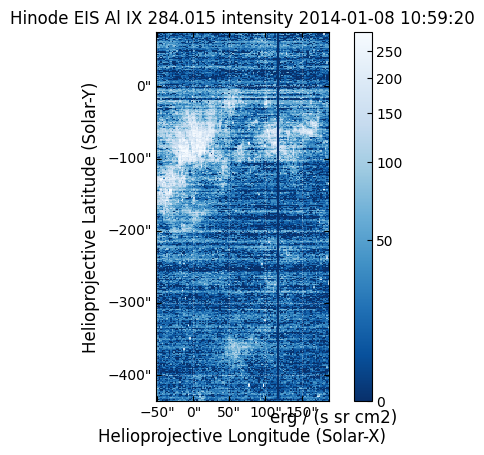

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


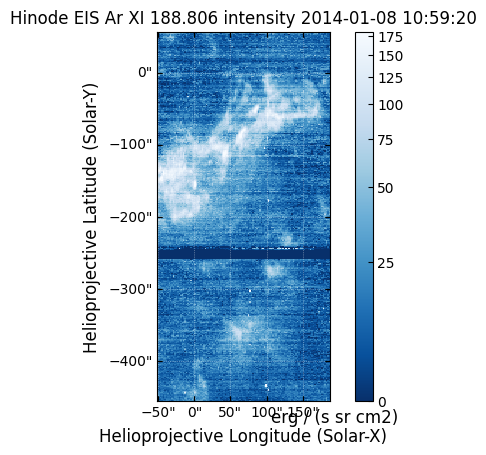

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


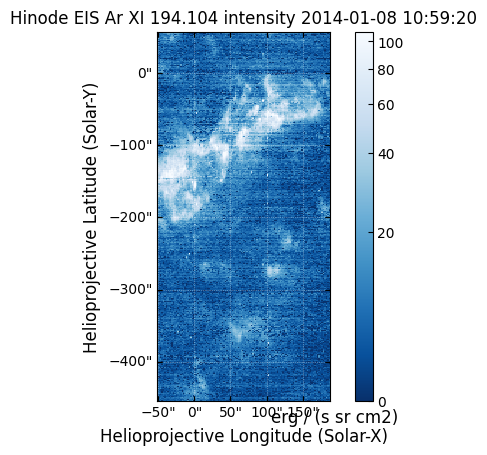

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


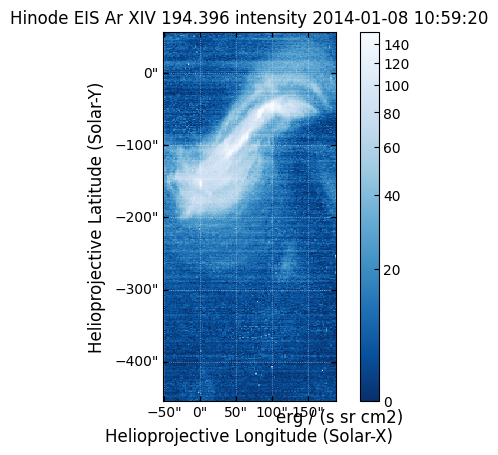

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


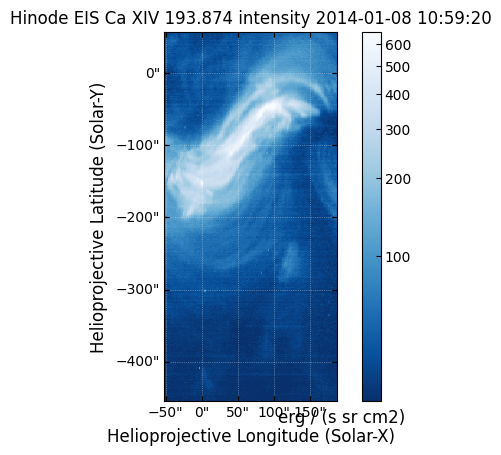

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


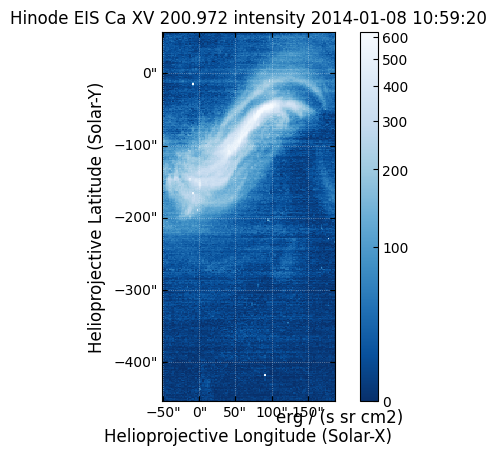

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


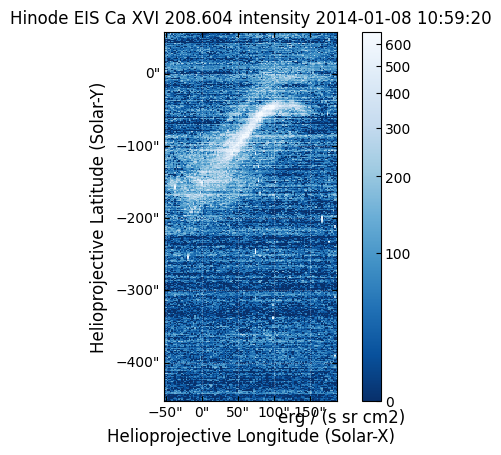

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


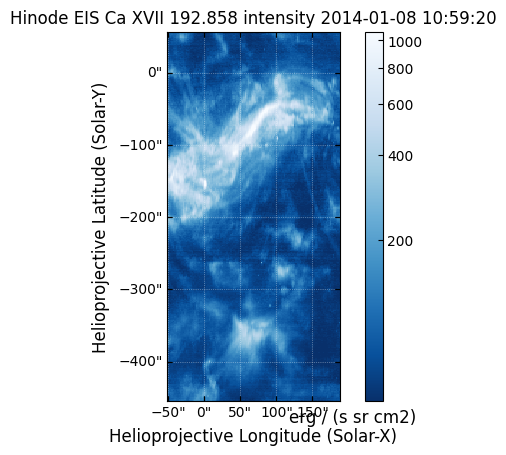

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


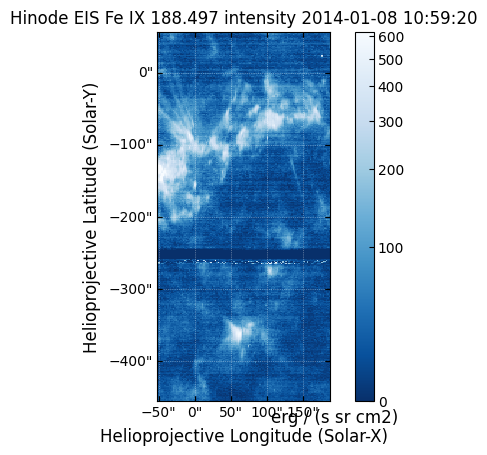

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


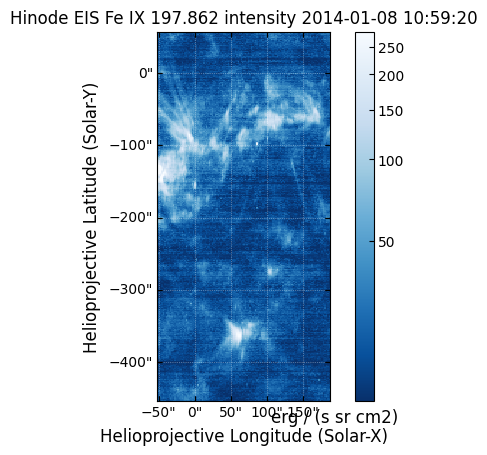

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


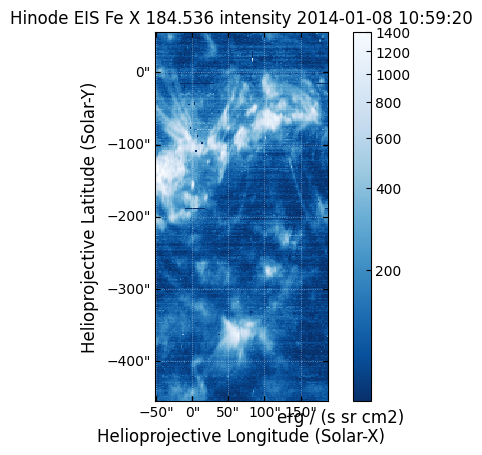

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


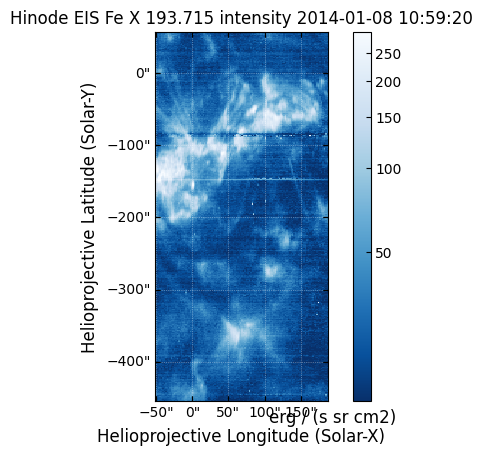

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


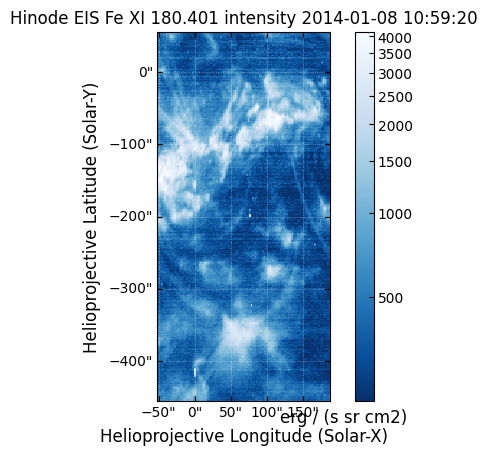

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


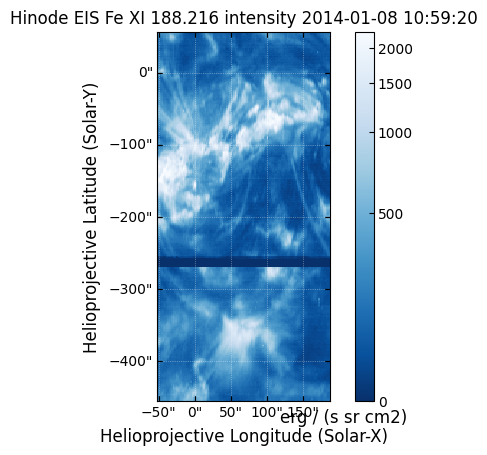

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


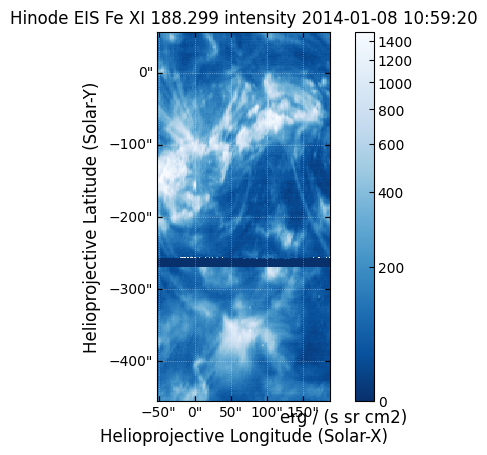

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


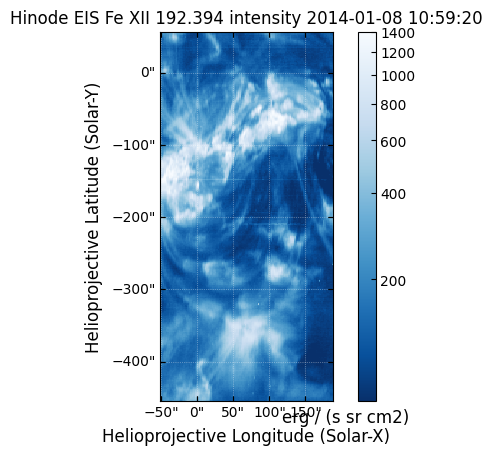

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


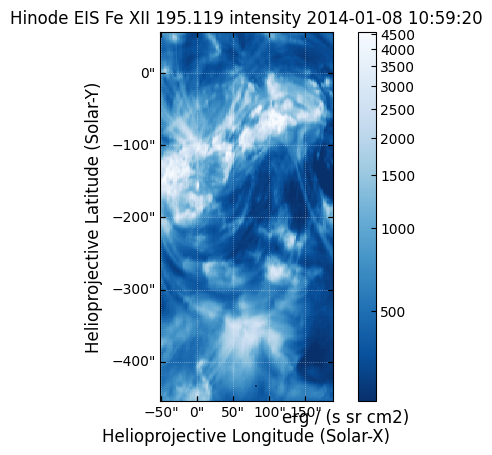

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


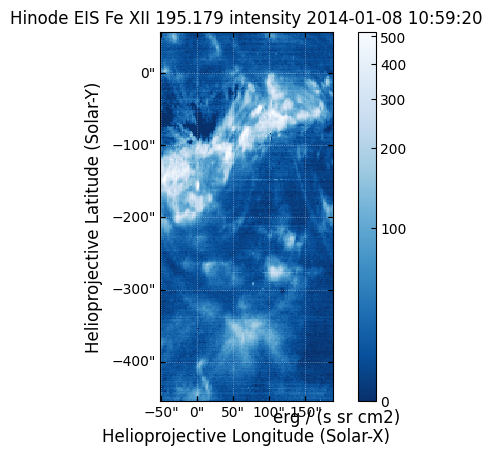

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


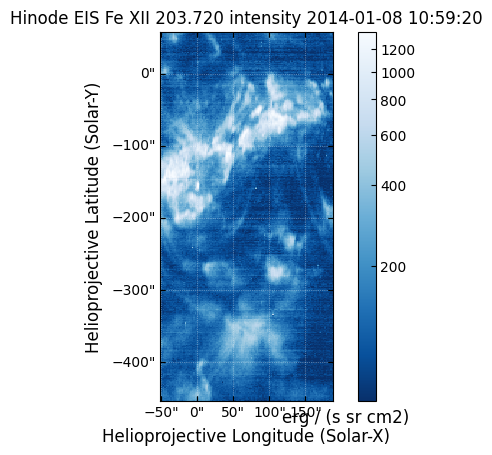

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


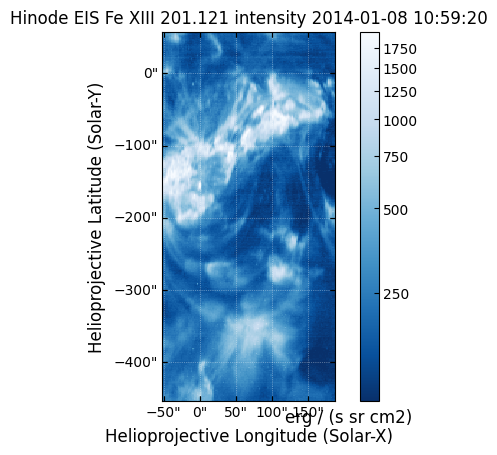

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


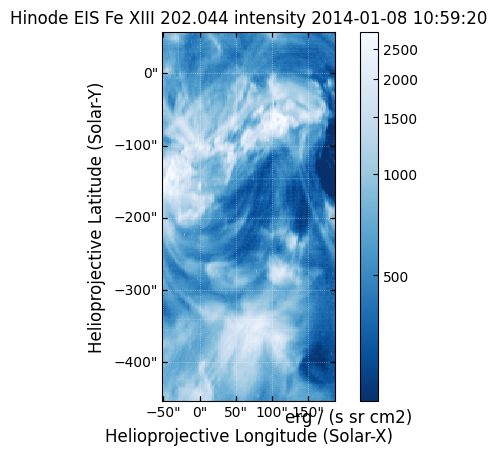

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


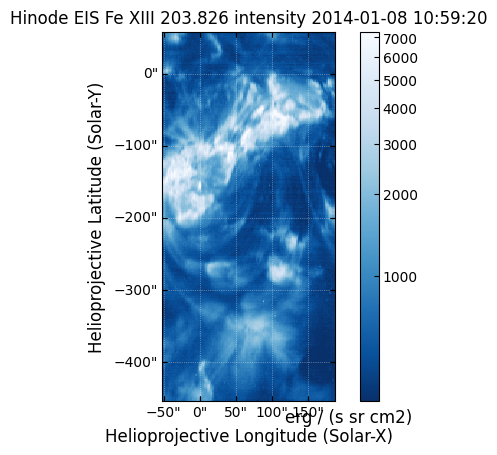

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


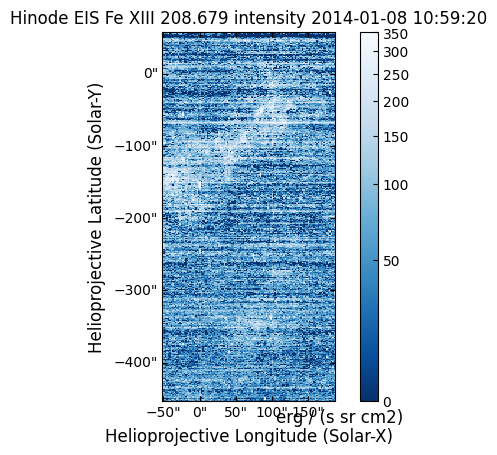

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


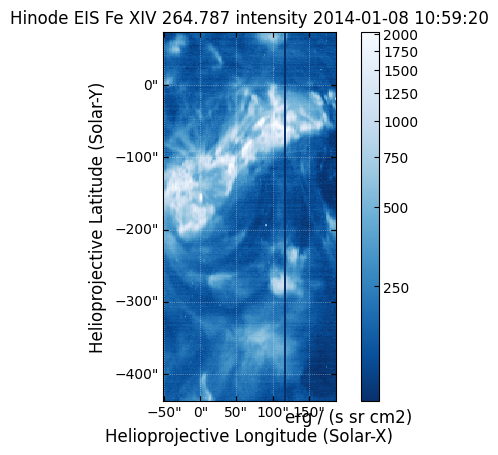

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


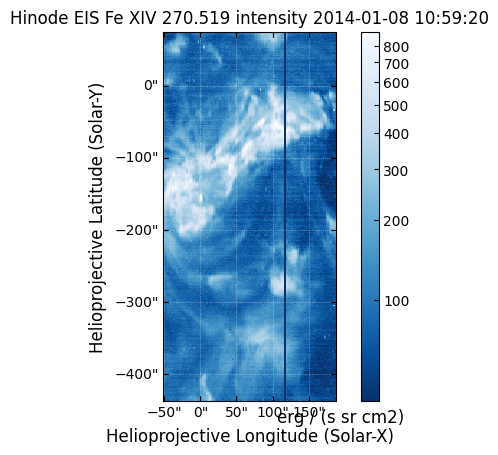

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


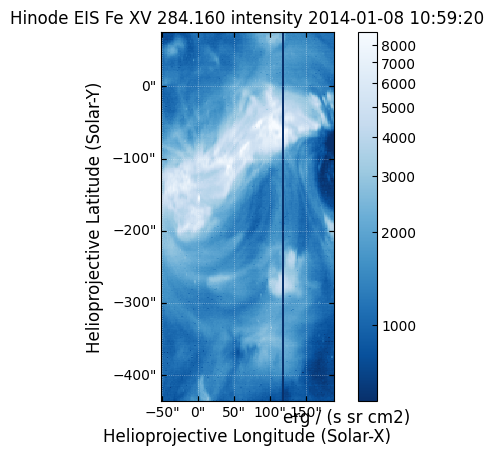

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


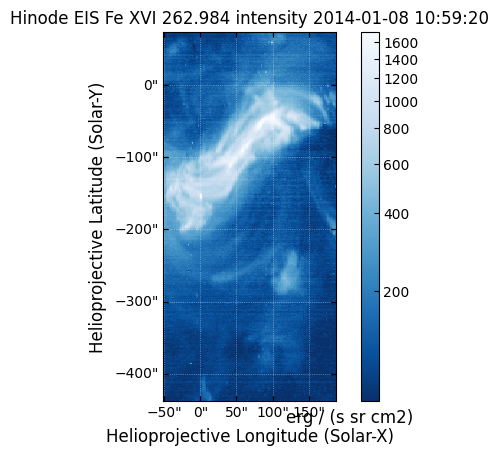

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


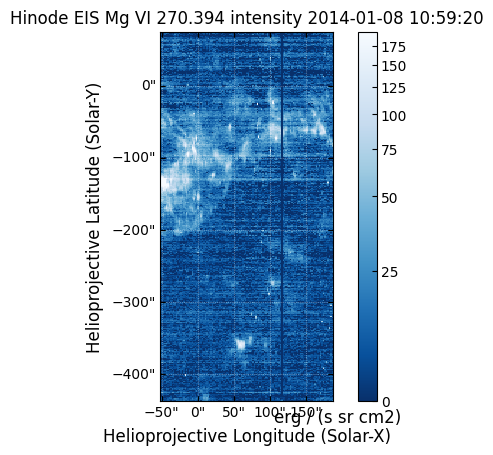

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


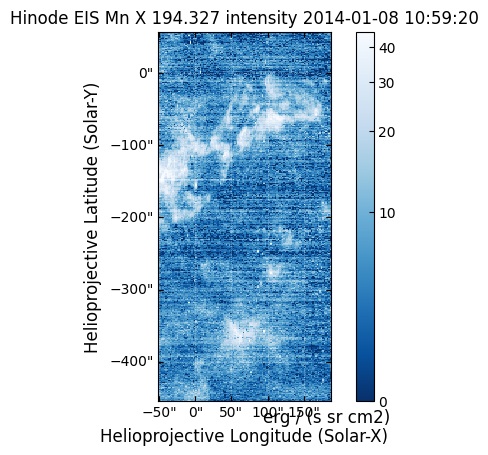

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


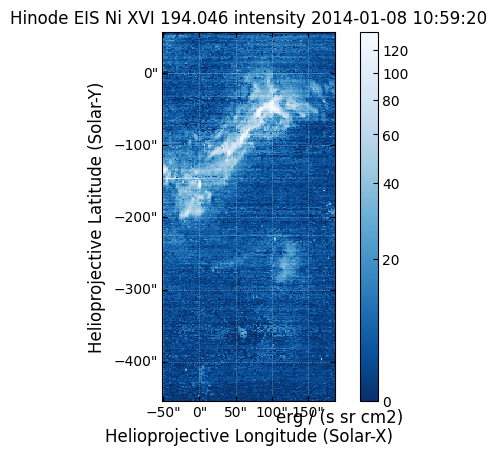

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


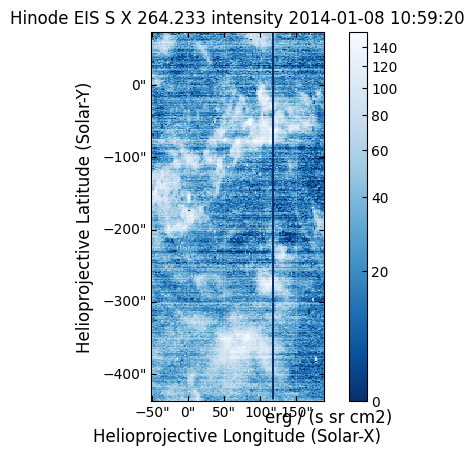

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


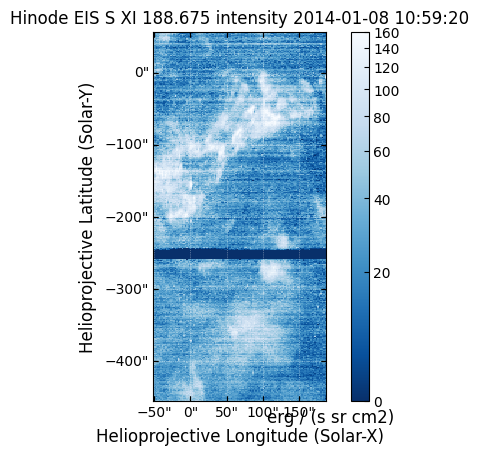

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


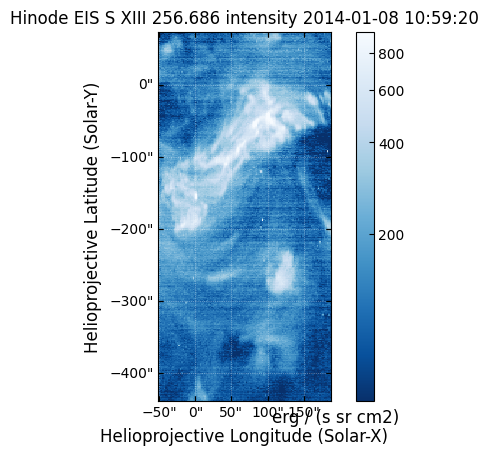

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


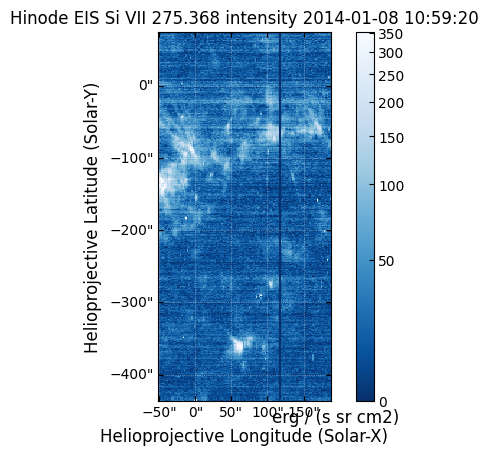

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


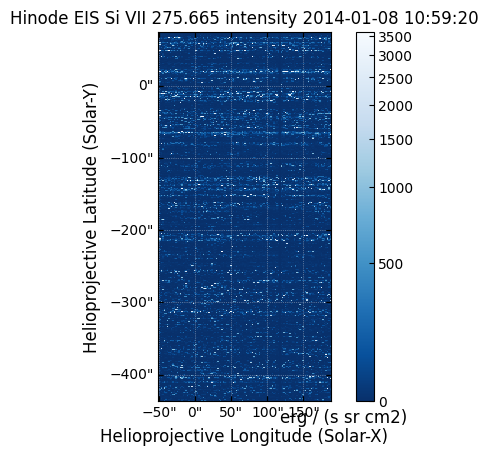

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


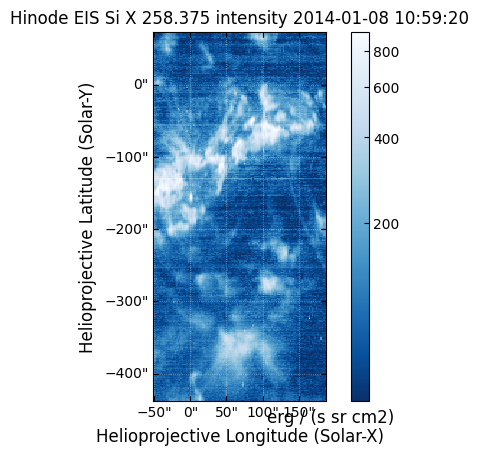

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


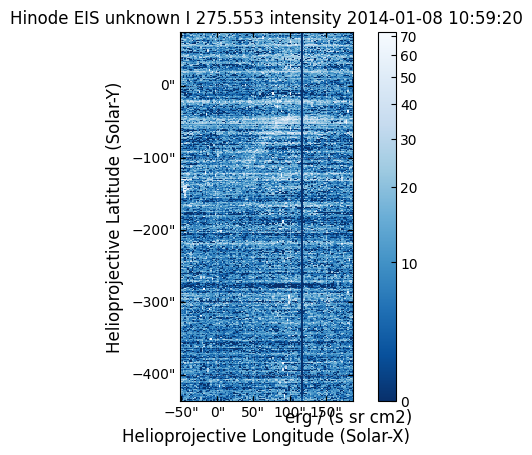

In [12]:
for m in m_11944:
    m.peek(clip_interval=(1,99.9)*u.percent)

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


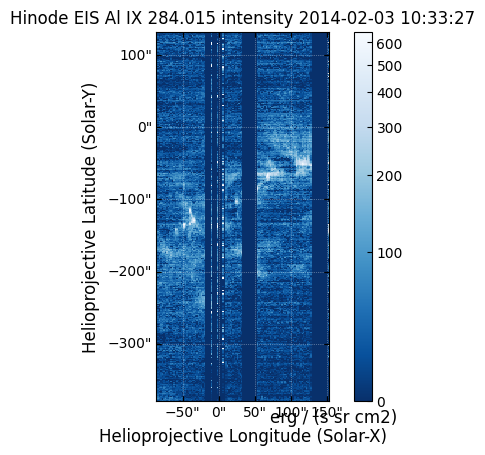

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


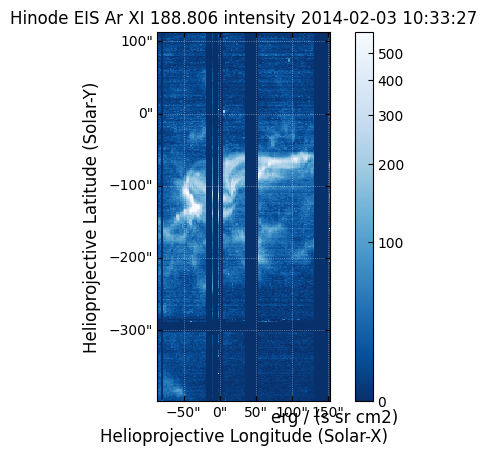

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


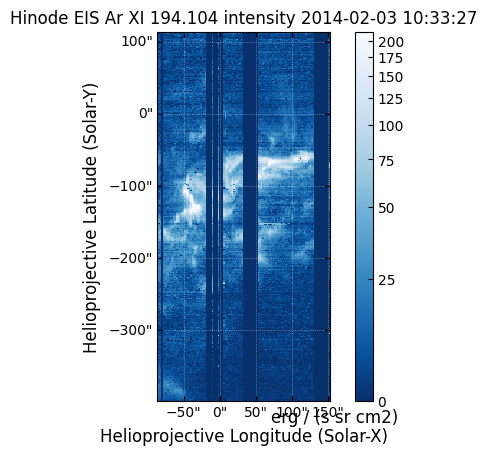

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


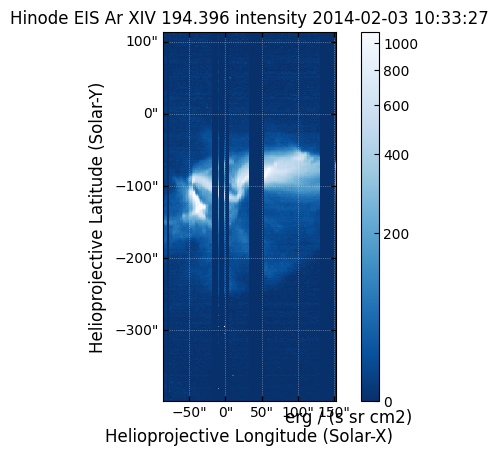

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


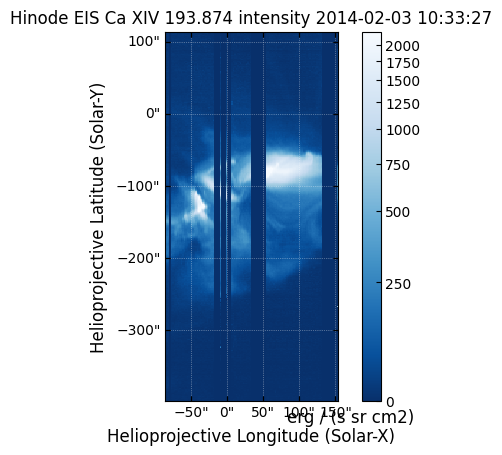

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


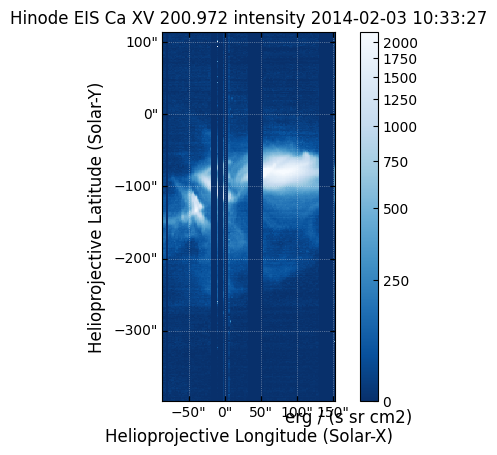

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


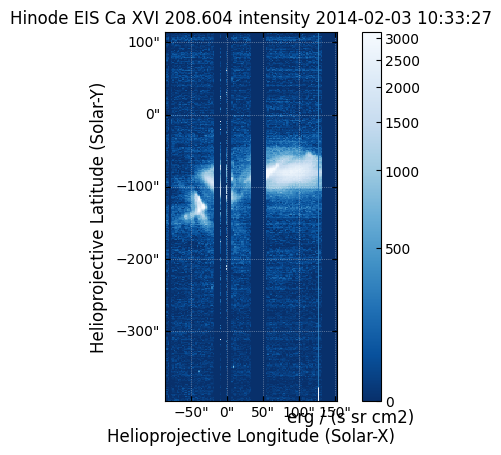

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


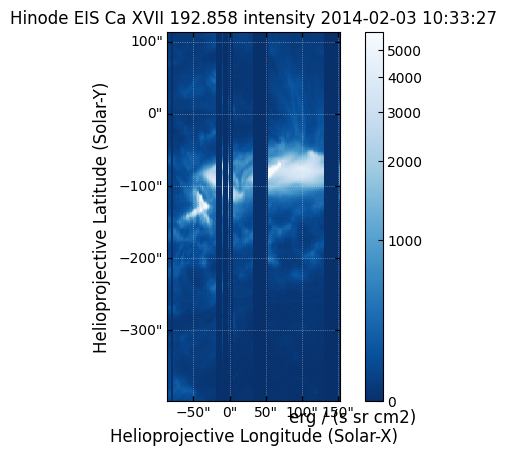

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


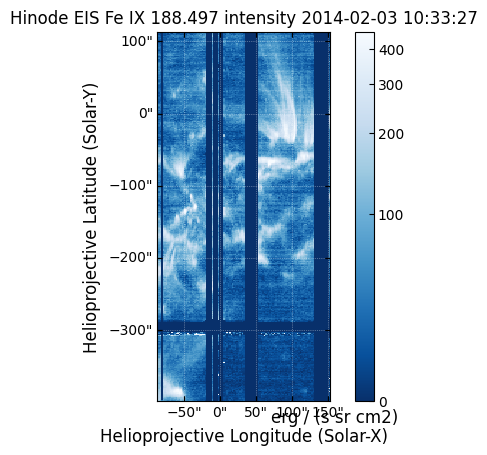

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


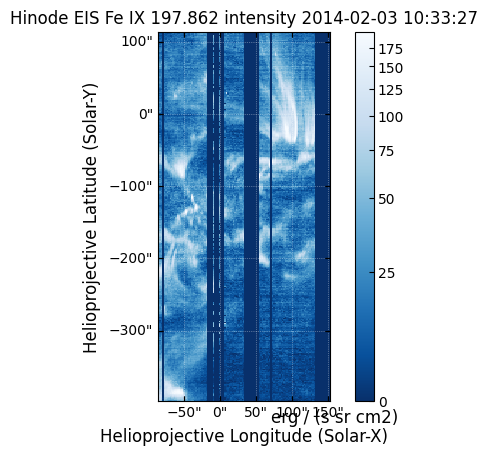

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


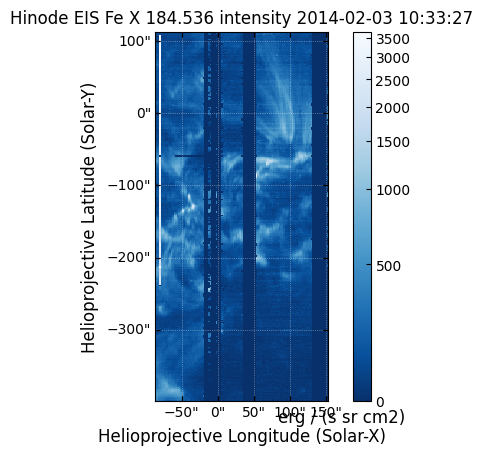

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


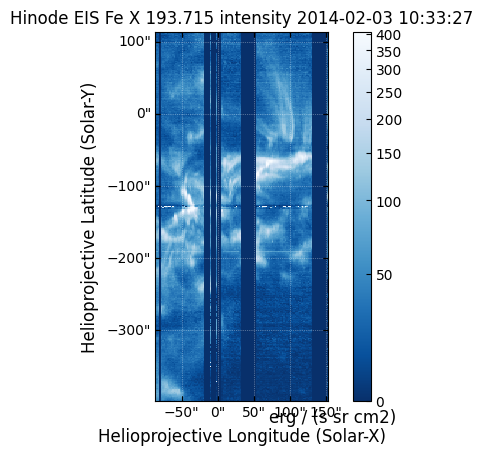

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


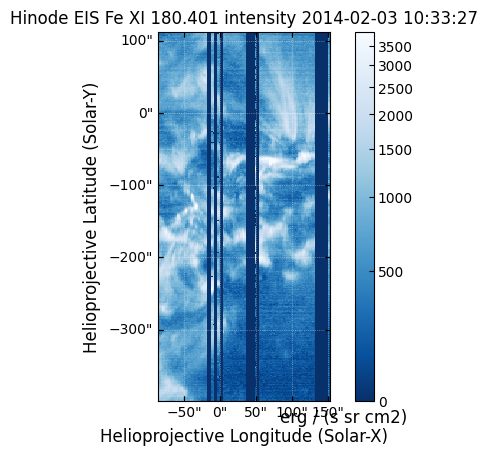

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


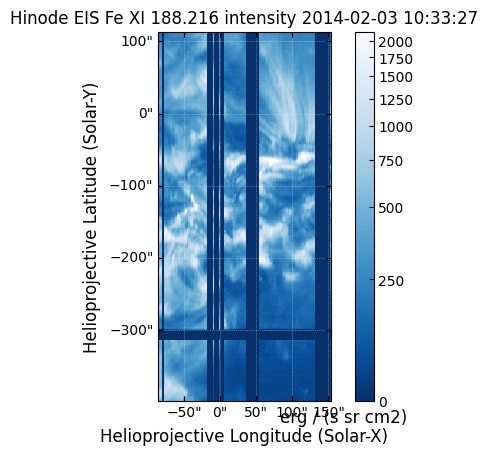

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


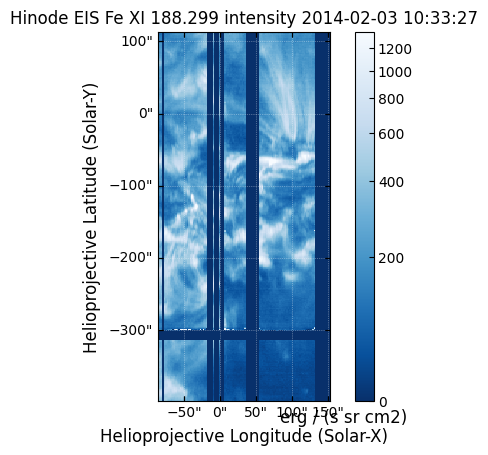

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


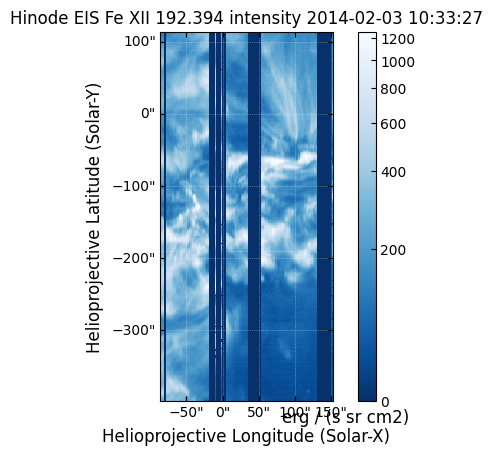

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


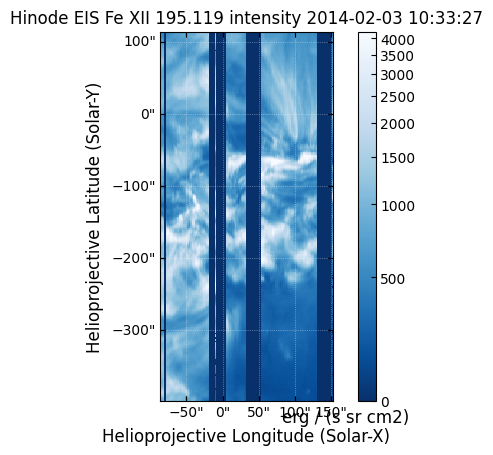

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


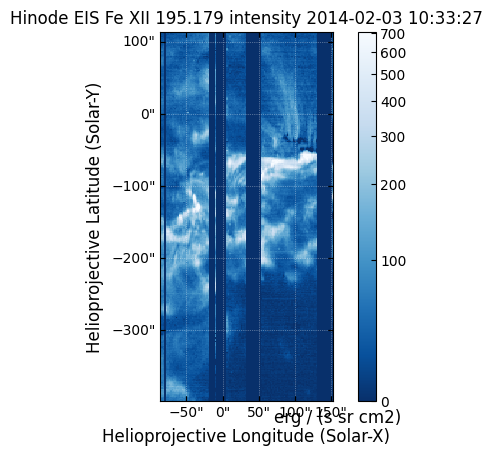

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


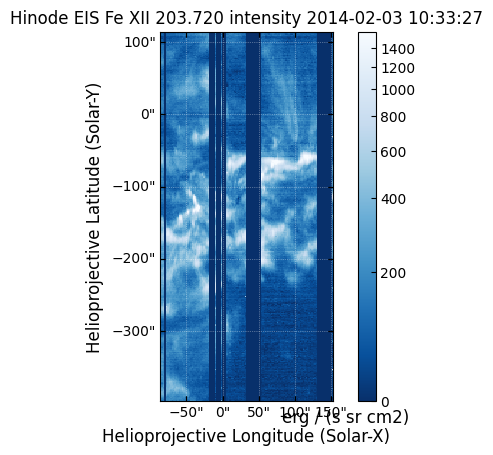

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


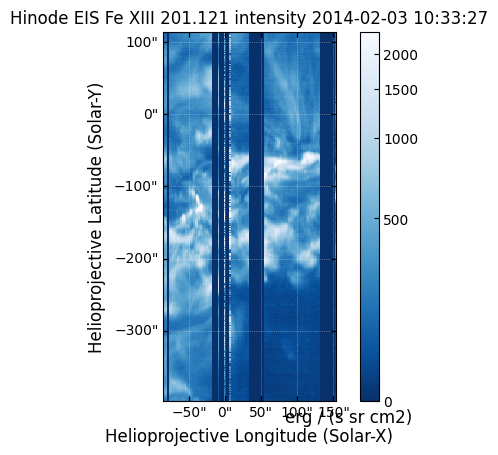

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


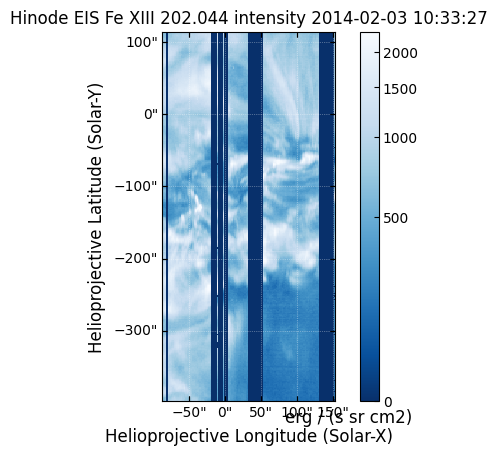

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


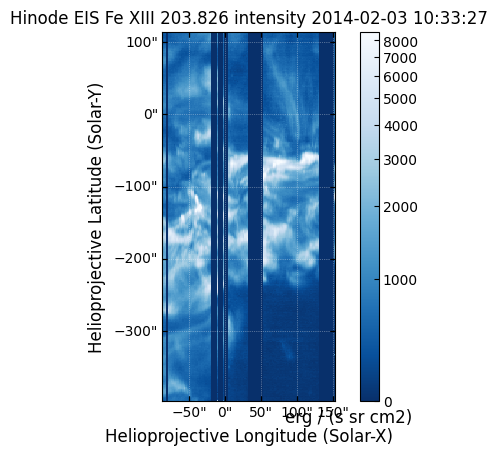

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


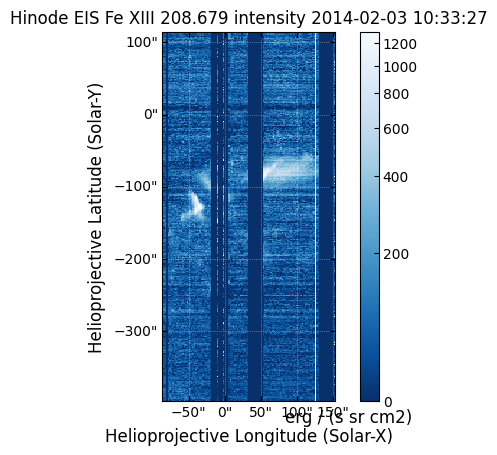

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


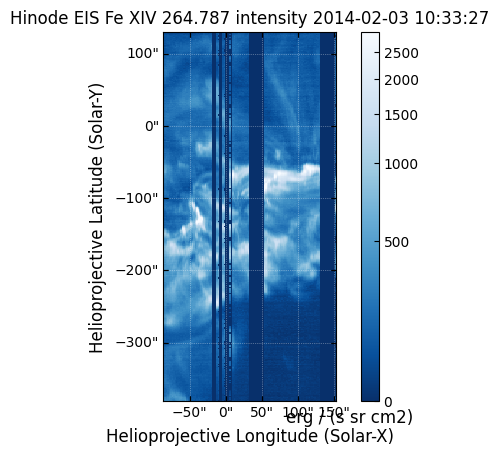

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


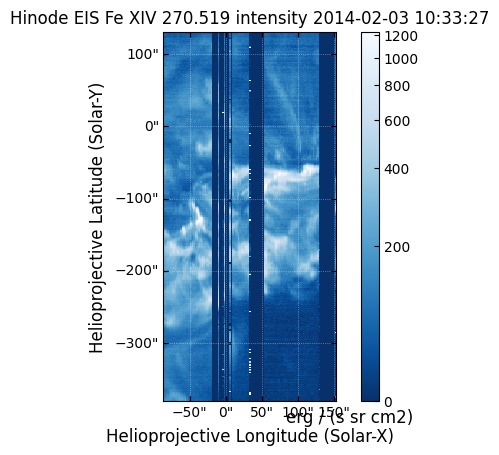

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


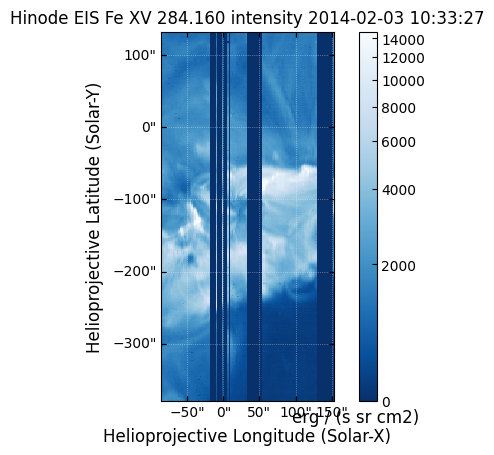

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


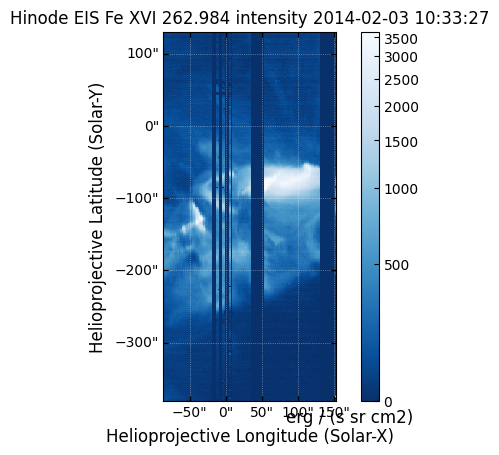

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


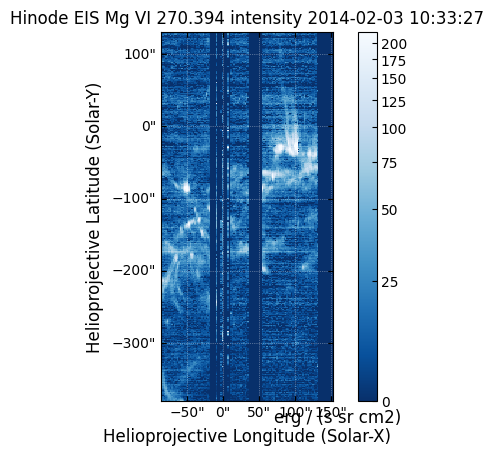

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


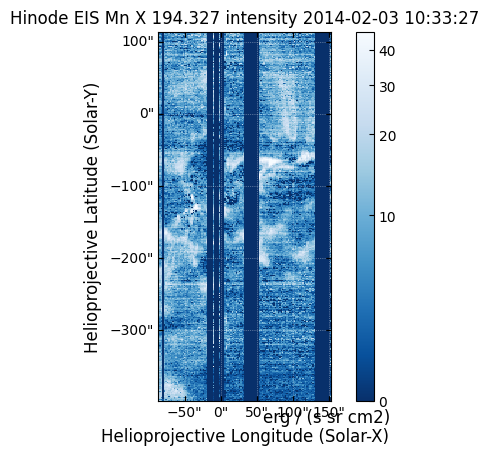

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


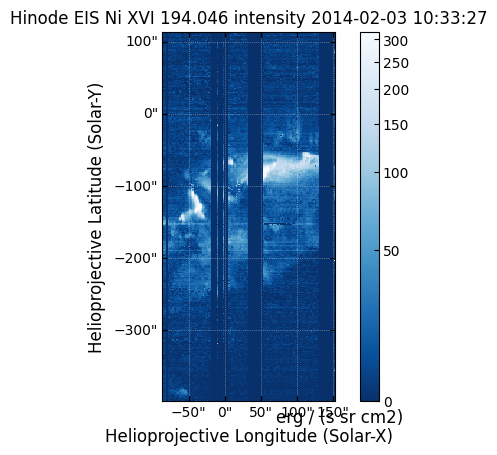

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


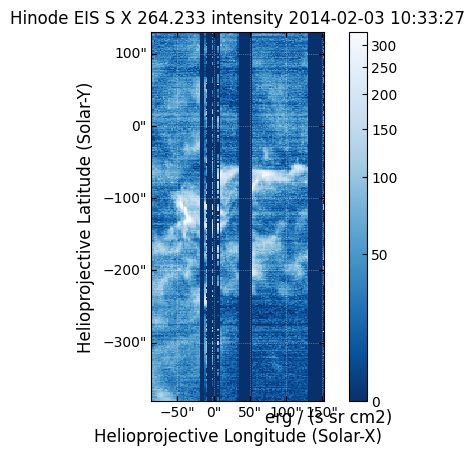

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


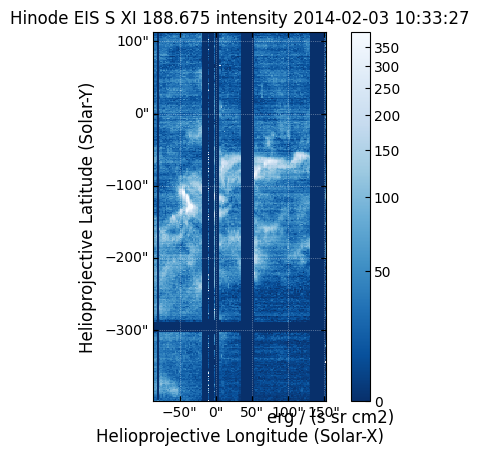

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


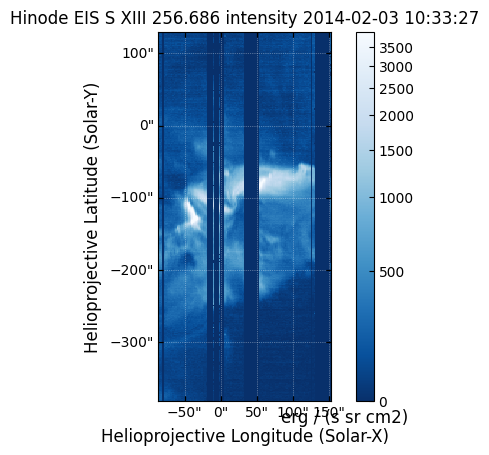

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


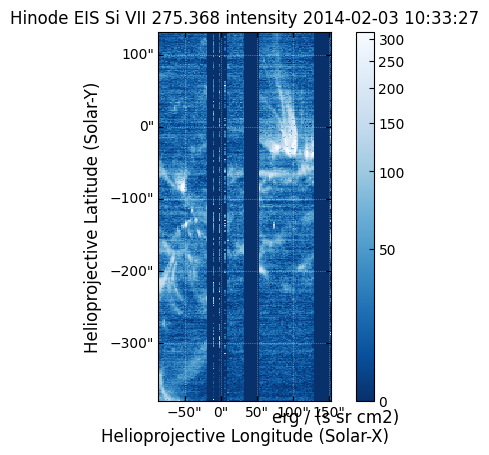

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


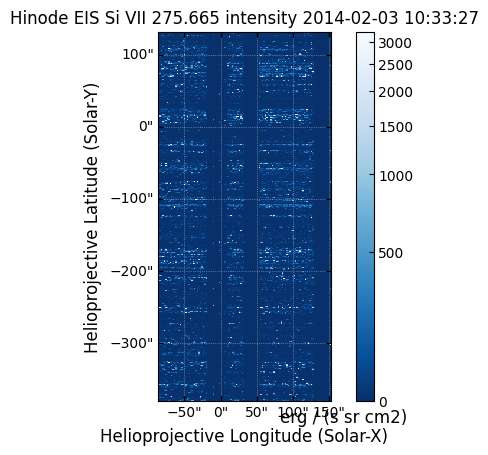

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


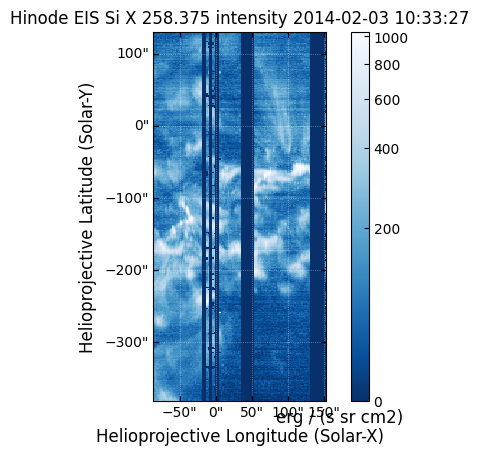

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


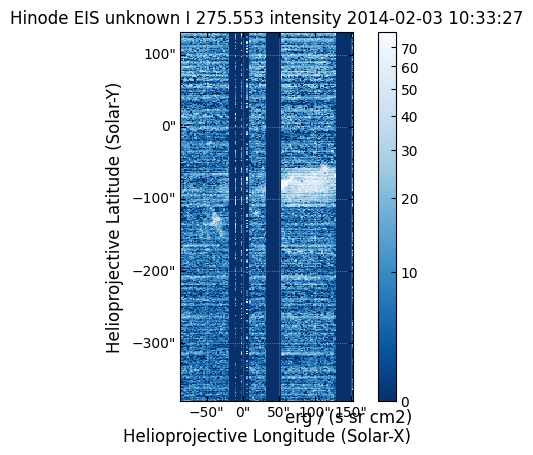

In [13]:
for m in m_11967:
    m.peek(clip_interval=(1,99.9)*u.percent)

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


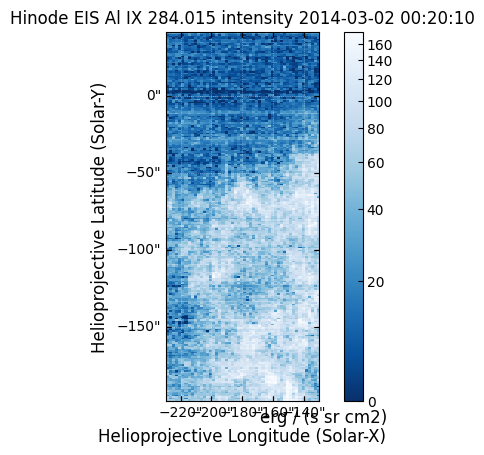

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


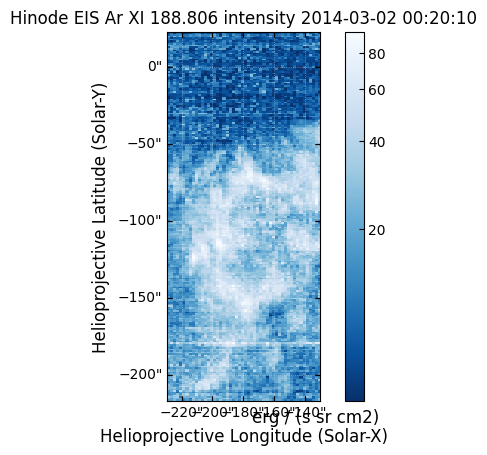

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


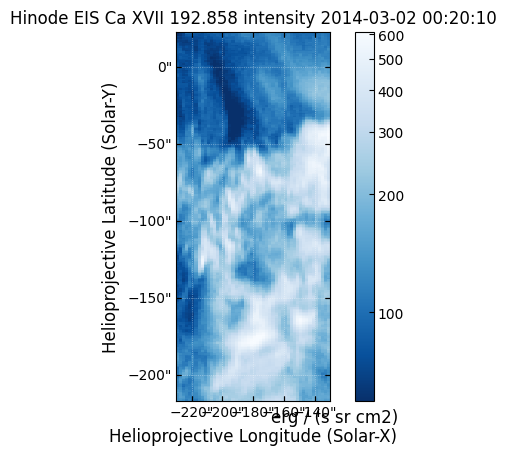

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


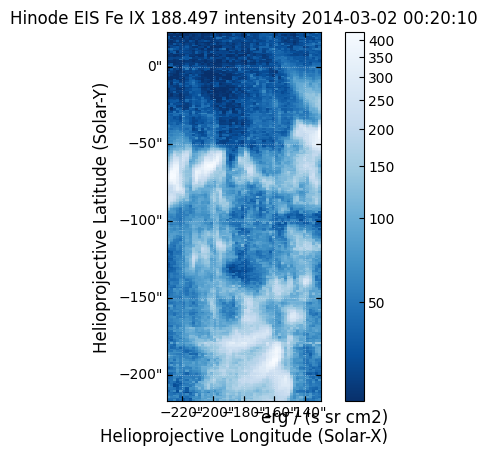

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


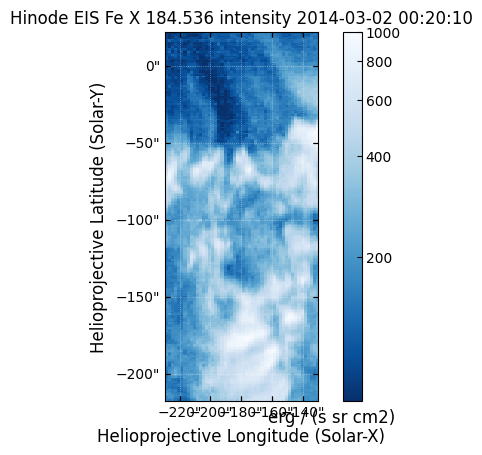

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


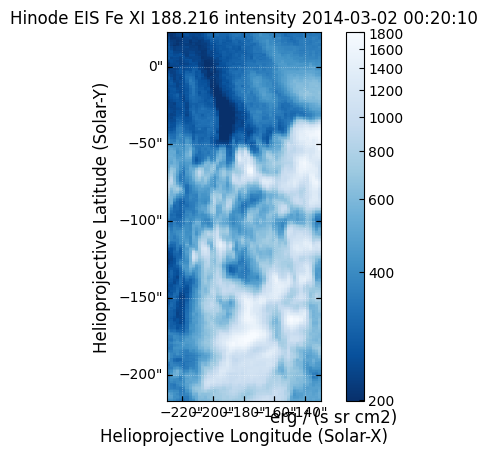

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


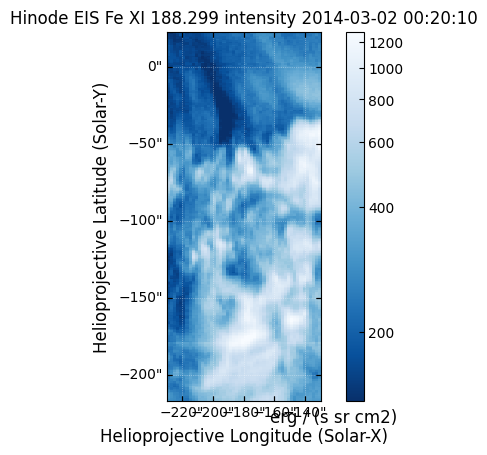

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


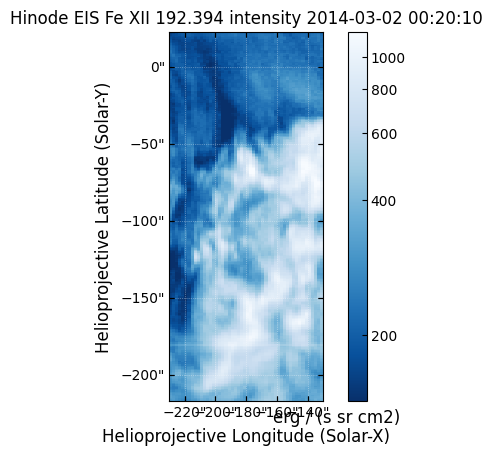

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


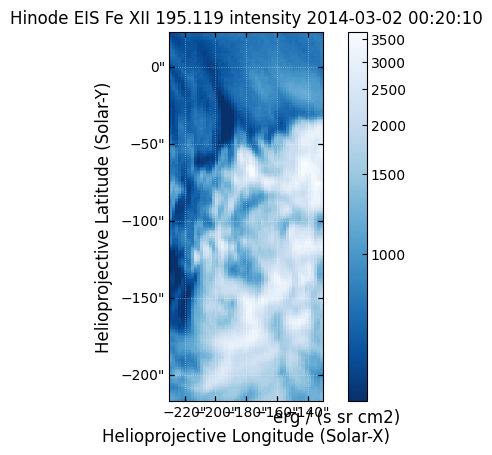

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


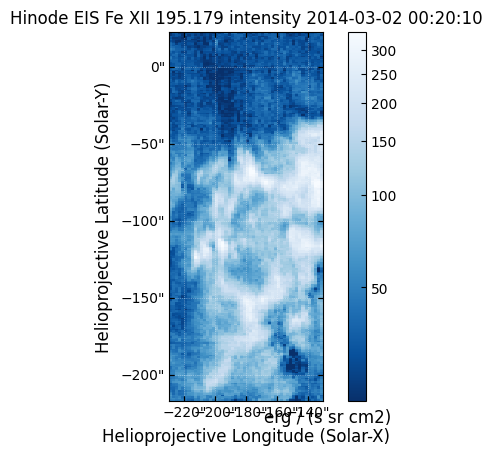

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


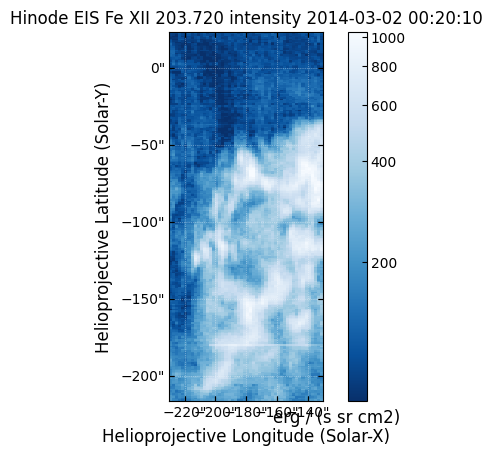

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


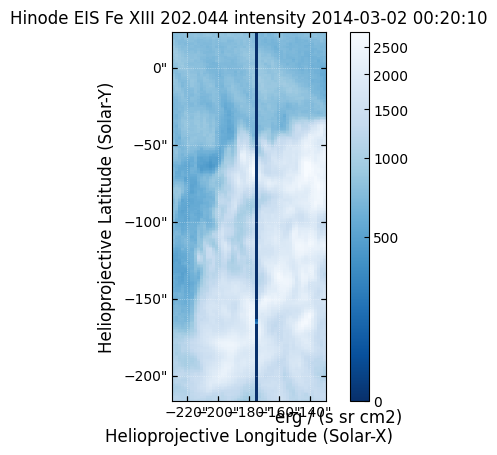

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


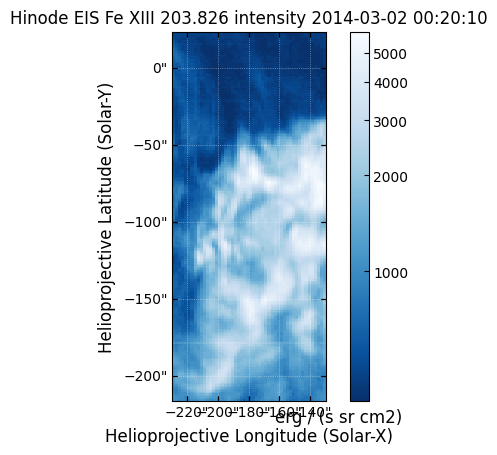

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


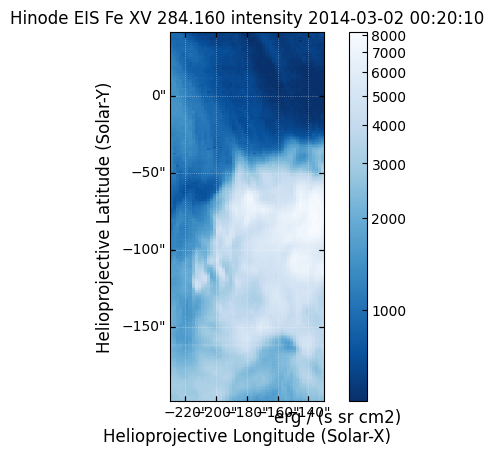

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


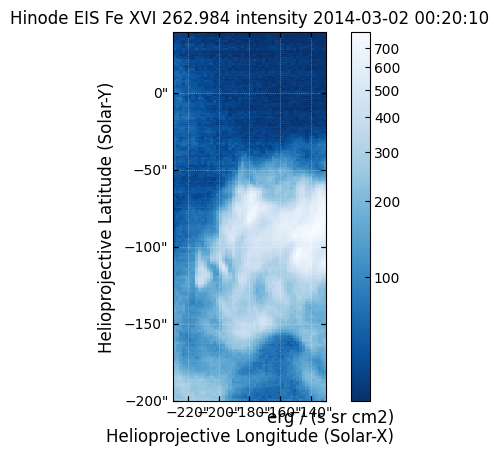

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


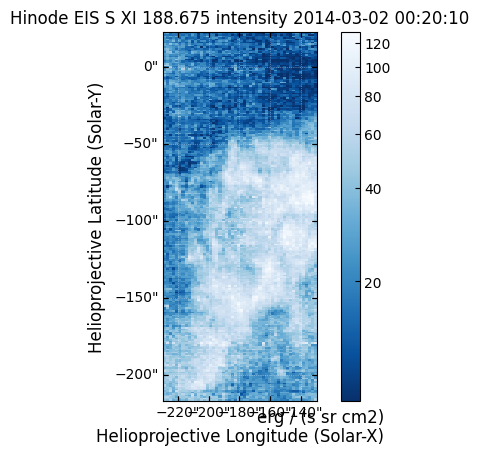

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


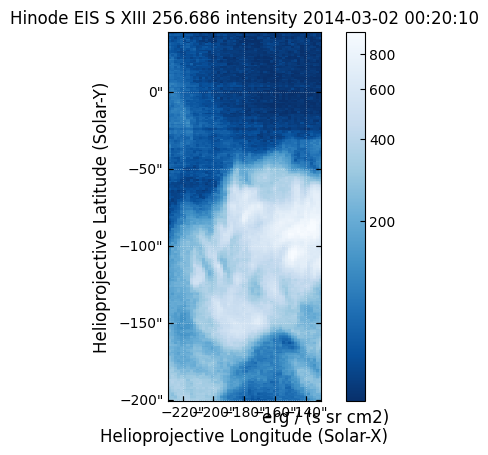

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


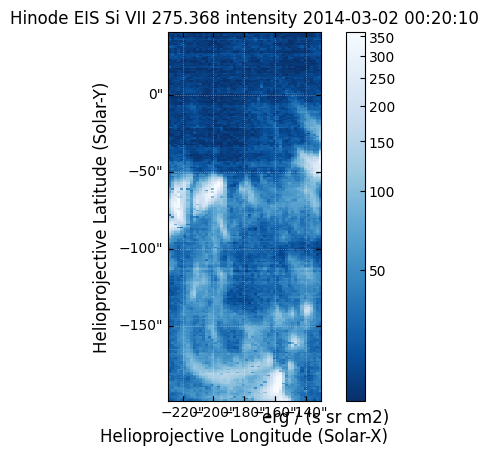

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


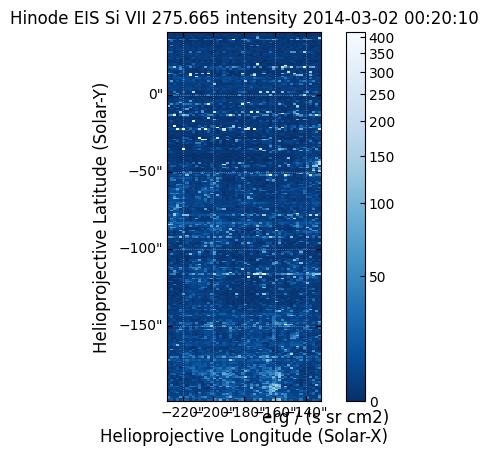

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


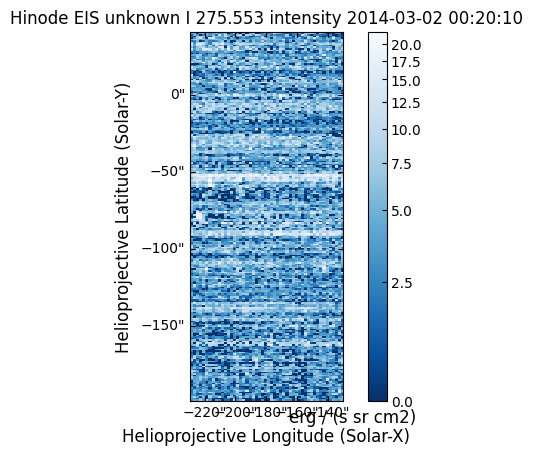

In [14]:
for m in m_11990:
    m.peek(clip_interval=(1,99.9)*u.percent)

In [15]:
fix_eis_pointing('../data/noaa_11944/EIS/level_2/', '../data/noaa_11944/EIS/level_2.5/')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.193A_2014_01_08T10_59_18.84Z.image_lev1.fits:   0%|          | 0.00/12.7M [00:00<?, ?B/s]

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


In [16]:
fix_eis_pointing('../data/noaa_11967/EIS/level_2/', '../data/noaa_11967/EIS/level_2.5/')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.193A_2014_02_03T10_33_30.84Z.image_lev1.fits:   0%|          | 0.00/12.6M [00:00<?, ?B/s]

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


In [17]:
fix_eis_pointing('../data/noaa_11990/EIS/level_2/', '../data/noaa_11990/EIS/level_2.5/')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia.lev1.193A_2014_03_02T00_20_08.86Z.image_lev1.fits:   0%|          | 0.00/10.9M [00:00<?, ?B/s]

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


In [18]:
m_11944_corrected = sunpy.map.Map('../data/noaa_11944/EIS/level_2.5/eis_20140108_095727.*.int.fits')
m_11967_corrected = sunpy.map.Map('../data/noaa_11967/EIS/level_2.5/eis_20140203_093134.*.int.fits')
m_11990_corrected = sunpy.map.Map('../data/noaa_11990/EIS/level_2.5/eis_20140302_000659.*.int.fits')